**Dataset:**  
Sample of T-Drive trajectory dataset that contains a one-week trajectories of 10,357 taxis. The total number of points in this dataset is about 15 million and the total distance of the trajectories reaches 9 million kilometers.


**References:**  
[1] Jing Yuan, Yu Zheng, Xing Xie, and Guangzhong Sun. Driving with knowledge from the physical world. In The 17th ACM SIGKDD international conference on Knowledge Discovery and Data mining, KDD’11, New York, NY, USA, 2011. ACM.  
[2] Jing Yuan, Yu Zheng, Chengyang Zhang, Wenlei Xie, Xing Xie, Guangzhong Sun, and Yan Huang. T-drive: driving directions based on taxi trajectories. In Proceedings of the 18th SIGSPATIAL International Conference on Advances in Geographic Information Systems, GIS ’10, pages 99-108, New York, NY, USA,2010. ACM.


**Task**:  
The aim of the task is to perform an exploratory data analysis of taxi driving trajectories in Beijing, determine the likely trips that the taxies took (the data is missing explicit start and stop information about the trips) and discover interesting insights about their behaviour.

***

Download and unzip data

In [1]:
!wget -q --header="Host: 3ai2lq.dm.files.1drv.com" --header="User-Agent: Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_3) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3729.131 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header="Referer: https://onedrive.live.com/" "https://3ai2lq.dm.files.1drv.com/y4mu-dEAQXcpWObZZFf86hSbCGLIBotS3N-mljQ-urBntUmyWgbL4UygnkOkc9NtcnOzXLD40FvKwW3mYknkJdaV0EsdzQCTcBe48EsBrRnBThq6EdymQciOVslMPCEBXbkvGnC2x617e9sWc6RAfU4ZUKY6eKW7iVKg1a46sMf-IvKFN3nlplpNqJk76Z5jyuQ/T-drive%20Taxi%20Trajectories.zip" -O "data.zip" -c && unzip -q data.zip && rm data.zip

Install packages from *requirements.txt*

In [2]:
!pip install -Uqr requirements.txt

In [3]:
import os
import tqdm
import imageio
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.cluster import DBSCAN
from IPython.display import display, Image, IFrame
from ipywidgets import HTML
from ipyleaflet import (basemaps, basemap_to_tiles, Circle, CircleMarker, 
                        FullScreenControl, Heatmap, LayersControl, LayerGroup,
                        Map, Marker, MarkerCluster, TileLayer)

%matplotlib inline
pd.options.mode.chained_assignment = None

In [4]:
!jupyter nbextension enable --py --sys-prefix ipyleaflet

Enabling notebook extension jupyter-leaflet/extension...
      - Validating: OK


In [5]:
DATA_PATH = "release/taxi_log_2008_by_id/"

In [6]:
# Concatenate dataframes from separate files into one
# This can take couple of mins to finish
data = pd.concat(
    [pd.read_csv(DATA_PATH+f, 
                 header=None,
                 parse_dates=["ts"],
                 dtype=dict(id=np.int32, long=np.float32, lat=np.float32),
                 names=["id", "ts", "long", "lat"]
                ) for f in os.listdir(DATA_PATH)]
)

# Then it makes sense to pickle large dataframe
pd.to_pickle(data, "data.pkl")

In [7]:
# Read data 
data = pd.read_pickle("data.pkl")

print(data.info())
data.head(2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17662984 entries, 0 to 484
Data columns (total 4 columns):
id      int32
ts      datetime64[ns]
long    float32
lat     float32
dtypes: datetime64[ns](1), float32(2), int32(1)
memory usage: 471.7 MB
None


,id,ts,long,lat
0,3644,2008-02-02 13:40:59,116.374969,39.857891
1,3644,2008-02-02 13:42:11,116.375420,39.857639


In [8]:
data.sort_values(by=["id", "ts"], inplace=True)

# Drop duplicated signals coming exactly at the same time
data.drop_duplicates(subset=["id", "ts"], inplace=True)
data.reset_index(drop=True, inplace=True)

# Time intervals between consecutive GPS signals, seconds
data["td"] = data.groupby("id")["ts"].diff().dt.seconds.astype(np.float32)

# Typical (modal) time interval b/w signals for each taxi
data["freq"] = data.groupby("id")["td"] \
                   .transform(lambda x: scipy.stats.mode(x)[0][0])

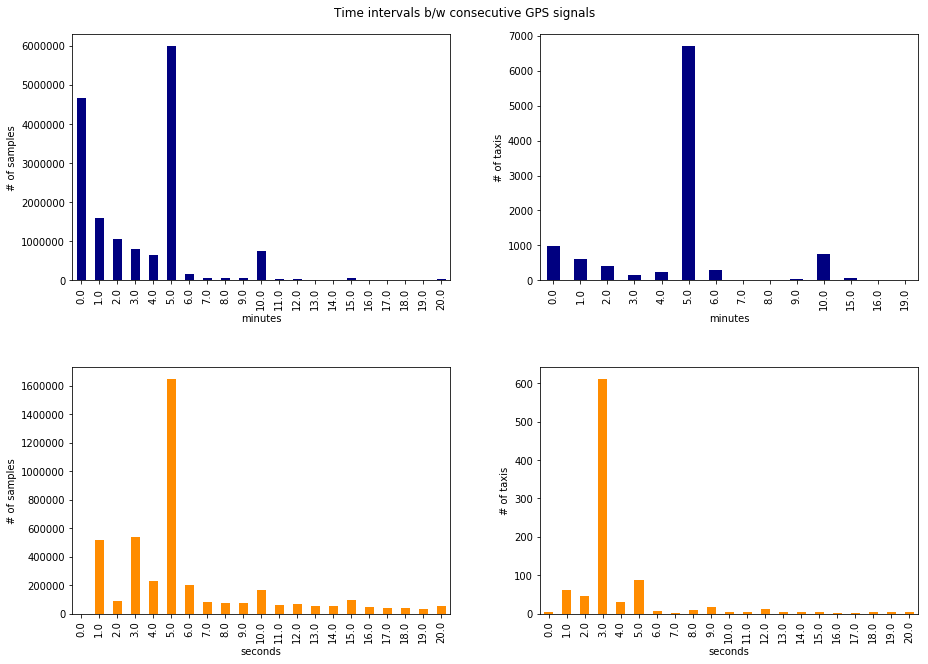

In [9]:
# Plot typical time intervals b/w GPS signals
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(13,9))

(data.td / 60).round() \
    .value_counts() \
    .sort_index(ascending=True)[:20] \
    .plot(kind="bar", color="navy", ax=ax[0][0]) \
    .set(xlabel="minutes", ylabel="# of samples");

data.td.value_counts() \
    .sort_index(ascending=True)[:20] \
    .plot(kind="bar", color="darkorange", ax=ax[1][0]) \
    .set(xlabel="seconds", ylabel="# of samples");

(data.drop_duplicates(subset="id")["freq"] / 60).round() \
     .value_counts() \
     .sort_index(ascending=True)[:20] \
     .plot(kind="bar", color="navy", ax=ax[0][1]) \
     .set(xlabel="minutes", ylabel="# of taxis");

data.drop_duplicates(subset="id")["freq"] \
    .value_counts() \
    .sort_index(ascending=True)[:20] \
    .plot(kind="bar", color="darkorange", ax=ax[1][1]) \
    .set(xlabel="seconds", ylabel="# of taxis");

fig.suptitle("Time intervals b/w consecutive GPS signals", y=1.02);
fig.tight_layout(w_pad=4, h_pad=4);

Comments:
- Most of data points have 5-min, 1-sec, 3-sec, 5-sec intervals b/w signals.
- However, frequent signals (1-sec, 3-sec, 5-sec) are generated by only few taxi cars. Vast majority of taxis have 5-min typical intervals. 

Also, signal frequency can vary from time to time within one car:

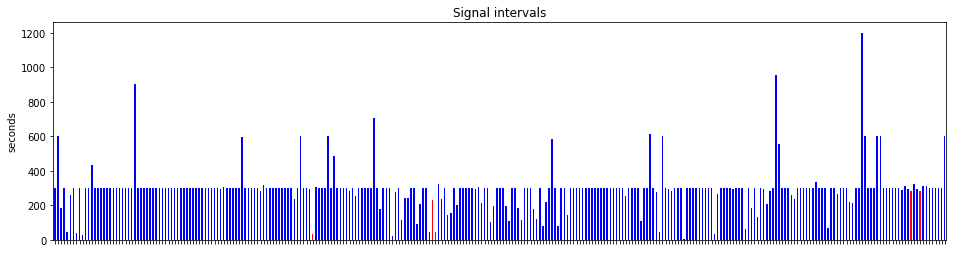

In [10]:
# Time of waiting at the same place, exact coordinates
data["wait_td"] = np.where((data[["long", "lat"]] - \
                            data[["long", "lat"]].shift() == 0).all(axis=1), 
                           data["td"], 0)

# Random taxi with 5-min signal frequency
# Plot all signals for one day
# Red colored bars - intervals of waiting
_df = data.loc[(data.ts.dt.weekday_name == "Monday") & \
               (data.id == 1944)]
colors = ["red" if x > 0 else "blue" for x in _df.wait_td]
ax = _df["td"].plot(kind="bar", color=colors, figsize=(16,4)) \
        .set(ylabel="seconds", title="Signal intervals", xticklabels=[]);

Calculate useful metrics:

In [11]:
def cumulative_sum(series):
    """
    Calculates cumulative sum of values for pd.Series.
    Resets cumulative sum when zero value is met in array.
    """
    arr = series.values
    cum_res = np.zeros(len(arr), dtype=np.float32)
    icum = 0
    for i,w in enumerate(arr[1:], 1):
        icum = icum + w if w > 0 else 0
        cum_res[i] = icum
    return cum_res

def cumulative_max(series, ret_idxs=False):
    """
    Calculates max of sub-array of cumulative values.
    Another option - return indices of max values.
    """
    idxs, values = series.index, series.values
    cum_max = np.zeros(len(values), dtype=np.float32)
    idxs_zero = np.argwhere(values == 0).ravel()
    idxs_diff = np.diff(idxs_zero)
    idxs_start = idxs_zero[:-1][idxs_diff > 1] + 1
    idxs_end = idxs_zero[1:][idxs_diff > 1] - 1
    arr = values if not ret_idxs else idxs
    for i_start, i_end in zip(idxs_start, idxs_end):
        cum_max[i_start:i_end+1] = arr[i_end]
    return cum_max

def calculate_distance(df):
    """Calculates distance in meters b/w pairs of coordinates"""
    R = 6378.137 # Radius of the Earth in km
    k = np.pi / 180
    x = df["long"].diff() * k * np.cos(k*(df["lat"] + df["lat"].shift()) / 2)
    y = df["lat"].diff() * k
    d = np.sqrt(x**2 + y**2) * R * 1000
    return d


# Cumulative sum of individual waiting intervals
data["wait_cum"] = data.groupby("id")["wait_td"].transform(cumulative_sum)

# Max of cumulative waiting intervals
data["wait_max"] = data.groupby("id")["wait_cum"].transform(cumulative_max)

# Distance, meters
data["dist"] = data.groupby("id").apply(calculate_distance).values

# Velocity, km/h
data["vel"] = ((data["dist"] / 1000) / (data["td"] / 3600)).astype(np.float32)

Count of signals split by day of week and hour

In [12]:
# Counts for 5-min signals
cnt = pd.crosstab(
        index=data[(data.td/60).round() == 5].ts.dt.hour.values,
        columns=[data[(data.td/60).round() == 5].ts.dt.weekday_name.values,
                 data[(data.td/60).round() == 5].ts.dt.date.values],
        rownames=["hour"],
        colnames=["weekday", "date"])\
    .sort_index(axis=1, level=1)

cnt.style.background_gradient(high=.5).set_properties(**{'width':'8em'})

weekday,Saturday,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday
date,2008-02-02,2008-02-03,2008-02-04,2008-02-05,2008-02-06,2008-02-07,2008-02-08
hour,,,,,,,
0,0,39407,45382,39662,38710,39611,40903
1,0,40173,44519,37219,36923,34503,40549
2,0,17275,36157,12852,29855,27176,7737
3,0,28877,42038,34747,36718,34845,39568
4,0,31718,39488,32400,33270,33346,35464
5,0,37290,37270,37279,34781,33705,39093
6,0,36458,36933,36871,35270,36174,38759
7,0,28924,37330,34526,36586,34507,39226


Comments:
- Date range is from *2008-02-02 (Saturday)* to *2008-02-08 (Friday)*
- In general, there is rapid traffic decrease from *2 am* until *9 am*

In [13]:
# Use these approx. coordinates of Beijing for visualization
city_bounds = {
                "lat": (39.75, 40.1), 
                "long": (116.15, 116.6)
              }

def zoom_data(data, bounds):
    """Filters data according to specified coordinates"""
    return data.loc[(data["lat"] > bounds["lat"][0]) & \
                    (data["lat"] < bounds["lat"][1]) & \
                    (data["long"] > bounds["long"][0]) & \
                    (data["long"] < bounds["long"][1])]


def plot_hexbin(data, ax, **kwargs):
    """Makes hexbin plot of locations (lat, long)"""
    kwargs_plot = dict(bins="log", gridsize=600, 
                       cmap=plt.cm.hot, vmin=1, vmax=800)
    kwargs_plot = {**kwargs_plot, **kwargs}
    x = data["long"]
    y = data["lat"]
    ax.hexbin(x, y, **kwargs_plot)
    ax.set_xlabel("Longitude");
    ax.set_ylabel("Latitude");

In [14]:
images = []
os.makedirs("temp/", exist_ok=True)

# Zoom data
data_plot = zoom_data(data, city_bounds)

# Make GIF from hourly data plots
for hour in tqdm.tqdm(range(24)):
    fig, ax = plt.subplots(1,2, figsize=(15,7))
    data_hour = data_plot[data_plot.ts.dt.hour == hour]
    plot_hexbin(data=data_hour[data_hour.ts.dt.weekday_name == "Monday"], ax=ax[0])
    ax[0].set_title("Monday");
    plot_hexbin(data=data_hour[data_hour.ts.dt.weekday_name == "Sunday"], ax=ax[1])
    ax[1].set_title("Sunday");
    for iax in ax:
        iax.set_xlim(city_bounds["long"]);
        iax.set_ylim(city_bounds["lat"]);
    fig.suptitle("Traffic data, " + str(hour) + ":00");
    path = "temp/" + str(hour) + ".png"
    plt.savefig(path, dpi=150, bbox_inches="tight")
    images.append(imageio.imread(path))
    plt.close()
    
imageio.mimsave("temp/traffic.gif", images, duration=3)

100%|██████████| 24/24 [08:22<00:00, 20.39s/it]


Basic animation of hourly traffic for Monday and Sunday (weekend).  
Both dates have very similar total count of signals.

In [ ]:
display(Image("temp/traffic.gif", unconfined=True, width=1000))

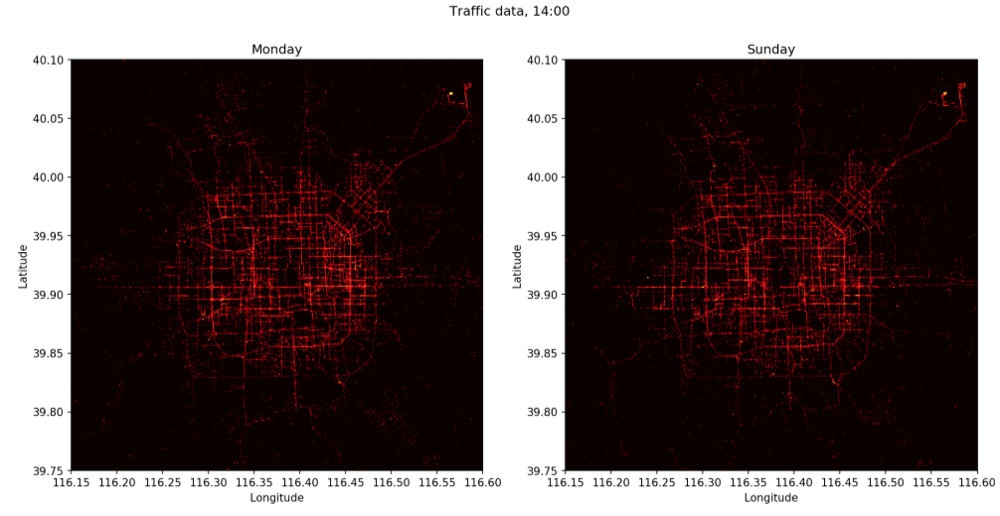

Comments:
- Eastern and south-western parts of the city have more traffic.
- The most central part of Beijing (around Forbidden city) is not heavily loaded (black region in the center), probably because of restricted driving.
- Trips from/to airport rapidly starts at 7-8 am (morning flights) until 2 am.
- Though hard to see, but busy hours start and end slightly earlier on Monday vs. Sunday.

One can plot heatmap with locations where drivers typically wait.  
Let's say waiting time is bounded with 3-30 min interval, i.e. short stops.

In [16]:
def create_map(hm_locs=None, zoom=10, **hm_kwargs):
    """Creates leaflet map with the center in Beijing."""
    layers = [basemap_to_tiles(basemaps.Esri.WorldImagery),
              basemap_to_tiles(basemaps.Esri.WorldStreetMap, opacity=.5)]
    # Plot heatmap if locations were specified
    if hm_locs:
        hm_kwargs = {**dict(name="Heatmap", radius=3, blur=5), **hm_kwargs}
        layers.append(Heatmap(locations=hm_locs, **hm_kwargs))
    # Create map
    m = Map(layers=layers,
            controls=(FullScreenControl(), LayersControl()),
            center=(39.9, 116.4),
            zoom=zoom
           )
    def _handle_click(**kwargs):
        """Adds marker on the map with exact coordinates as labels."""
        if kwargs.get("type") == "click":
            # Remove previous marker if it was created
            if isinstance(m.layers[-1], Marker):
                m.remove_layer(m.layers[-1])
            coords = kwargs.get("coordinates")
            marker = Marker(location=coords, name="Marker")
            msg = HTML(str(coords)[1:-1])
            marker.popup = msg
            m.add_layer(marker)
    m.on_interaction(_handle_click)
    m.layout.height = '800px'
    return m

In [17]:
# Plot short stops 3-30 mins (exact coordinates not changing)
data_plot = zoom_data(
                data=data[(data.wait_cum == data.wait_max) & \
                          (data.wait_max > 3*60) & \
                          (data.wait_max < 30*60)],
                bounds=city_bounds)

locs = [tuple(x) for x in data_plot[["lat", "long"]].values]
m = create_map(hm_locs=locs, zoom=11)

# Also, plot markers at interesting places on the map
coords = [
            (40.07140724911129, 116.56562441773963), 
            (40.010583340566896, 116.50611058187366)
         ]
m.add_layer(MarkerCluster(
    markers=[Marker(location=c, draggable=False) for c in coords],
    name="PointsOfInterest"
))
m

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

The same screenshot is provided below for the sake of not embedding HTML map into notebook

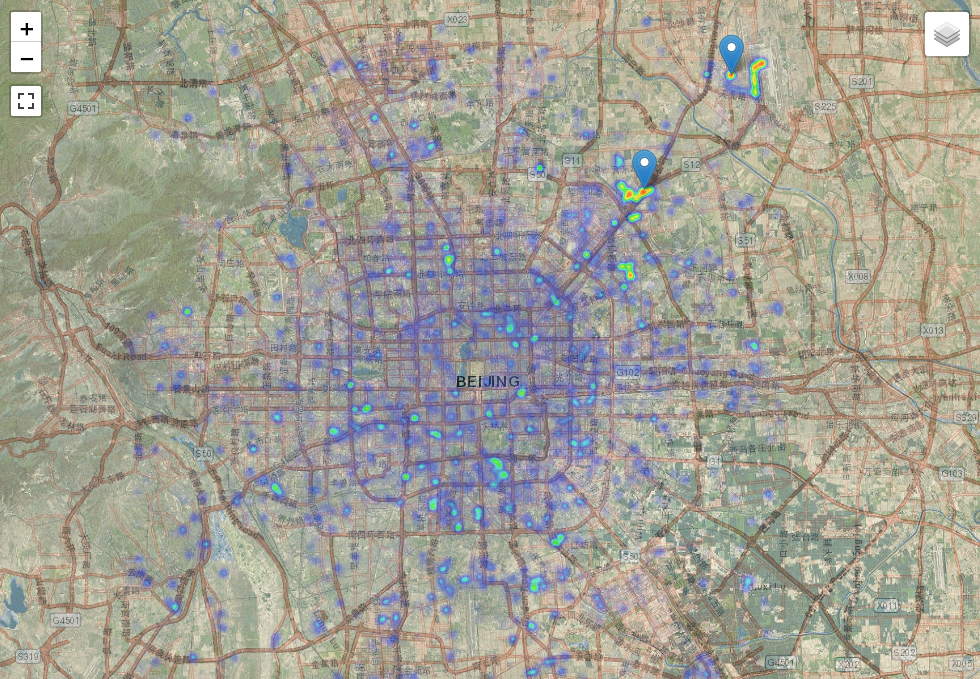

There are 2 places (besides airport) with high density of waiting cars (where blue markers are located).

- First one **(40.07140724911129, 116.56562441773963)** looks like wasteland now, however it could be conveniently located large parking in the past.  
Its location is very close to the airport.

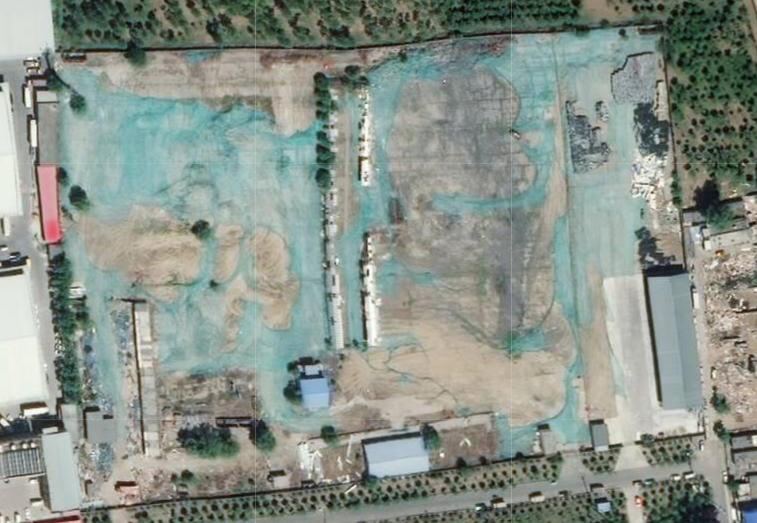

The second location (40.010583340566896, 116.50611058187366) is very noticeable.  
It is slightly outside of the city and represents I would say Mecca for taxi drivers. Here one could find:
- Auto service
- Car wash
- Tire shop
- Many cafes with street food (I guess cheap ones), ex. place named "Taxi Home Sichuan Kitchen"

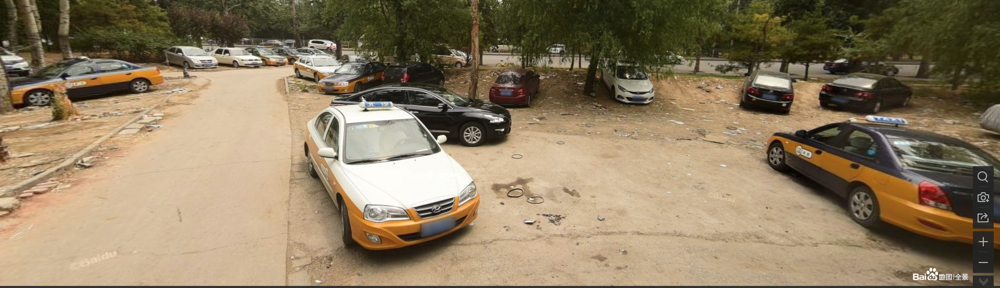

Other places are not so interesting - most of them are areas near railway stations or small parkings.

Interestingly, a number of signals have geoposition too far from Beijing:

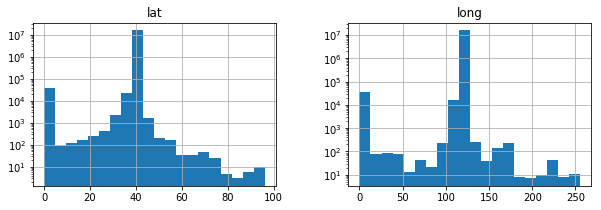

In [18]:
data[["lat", "long"]].hist(bins=20, figsize=(10,3), log=True);

We can plot locations of "normal" signals which are received just before outlying ones.  
The motivation for that comes from my experience - when you use GPS-navigation near the Kremlin of Moscow, sometimes you can see erroneous location of yourself (let's say 30+ km far away from real coordinates).

In [19]:
# Define outliers in GPS signals following any simple rule of thumb
# Signal is outlier if it is suddenly far from last "normal" point
data["is_outlier"] = np.where(
        ((data.lat < city_bounds["lat"][0] - 1) | \
         (data.lat > city_bounds["lat"][1] + 1)) & \
        ((data.long < city_bounds["long"][0] - 1) | \
         (data.long > city_bounds["long"][1] + 1)), True, False)

# Data to plot
data_plot = data[(data.is_outlier == False) & \
                 (data.is_outlier.shift(-1) == True) & \
                 ((data.td / 60).round().shift(-1) <= 5)
                ]

locs = [tuple(x) for x in data_plot[["lat", "long"]].values]
m = create_map(hm_locs=locs, zoom=11, max=.05, radius=4)

# Plot points of interest as markers on the map
coords = [
            (39.79289886316114, 116.39159627258778),
            (39.83636838181962, 116.35514936875553),
            (40.02284109956451, 116.20193246590827),
         ]

m.add_layer(MarkerCluster(
    markers=[Marker(location=c, draggable=False) for c in coords],
    name="PointsOfInterest"
))

m

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

Following this logics, some "strange" places just correspond to busy roads / large highway junctions. This could be reasonable if erroneous signals are distributed evenly among all samples.  

However, some places could seem curious.

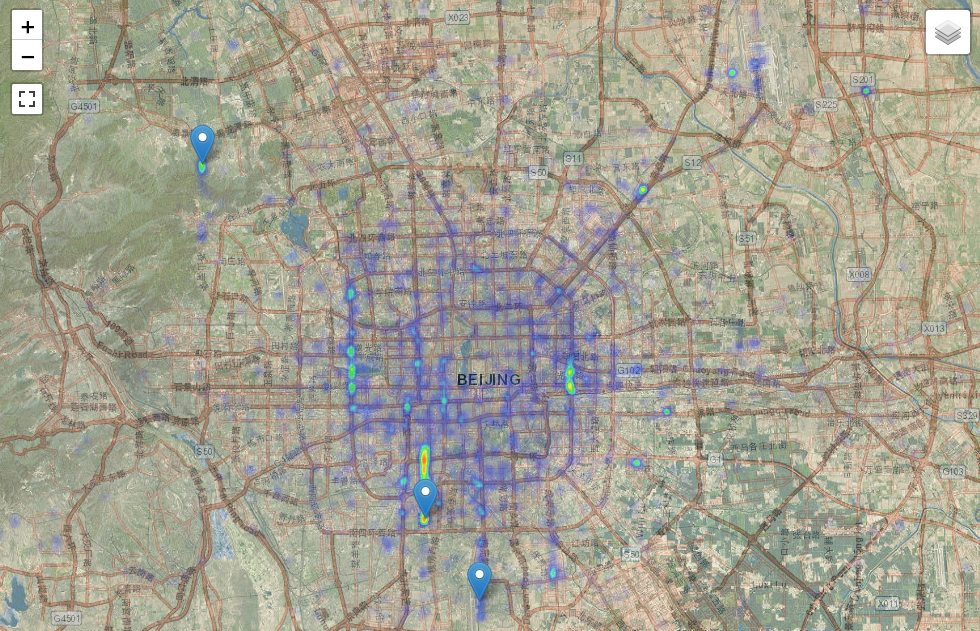

- Beijing Nanyuan Airport (39.79289886316114, 116.39159627258778)  
This airport is partially military.

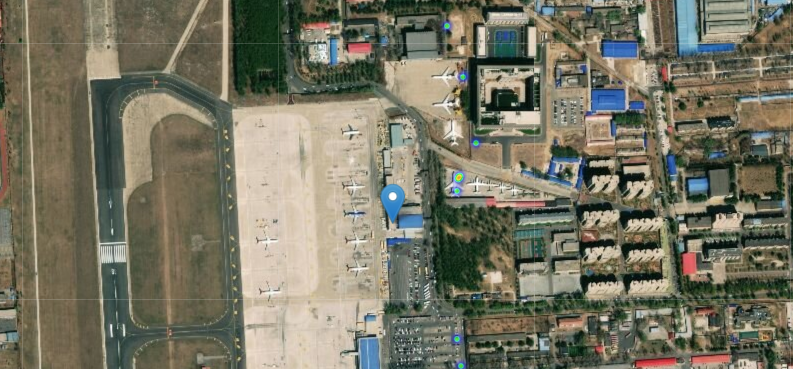

- Beijing Jinggang Subway Co. Ltd. (39.83636838181962, 116.35514936875553)
There is office of subway company. Starting roughly from here and up to 4 km to the north one can find the whole band of such bad signals.  
I would suggest, that here exists secret line of subway under the ground... or just it is just specific feature of how GPS works in China.

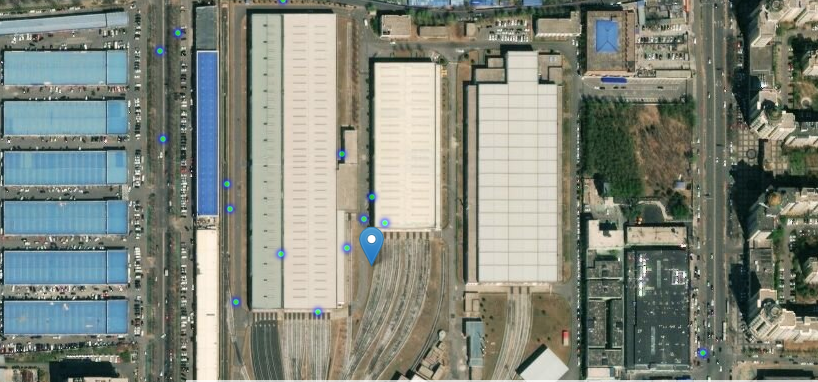

Finally, (40.02275020983426, 116.20172972431588).  
Here I guess mountainous terrain worsen geopositioning quality.

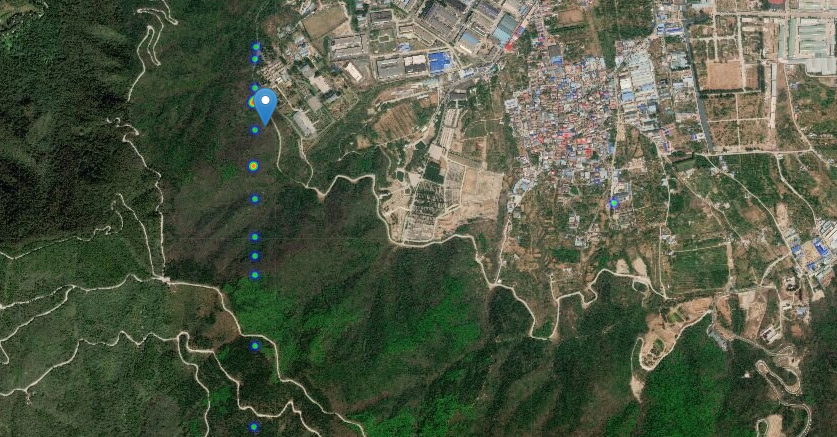

Next, one could plot traffic level.  
To be specific, let's take working day morning signals. 

Some ideas:
- It makes sense to plot signals which come fast (not more than 5 sec should pass) after previous ones.
- Signals should be aggregated (averaged) with other close points (binned data).
- We color each point according to its velocity (from red to green).

In [20]:
# Workdays, morning hours, short intervals b/w signals
# Data from several days for better performance
data_plot = zoom_data(
                data.loc[\
                    (data.td <= 5) & \
                    (data.vel > 0) & \
                    (data.td <= 5) & \
                    (data.ts.dt.weekday_name.isin(["Monday", "Tuesday", "Wednesday"])) & \
                    (data.ts.dt.hour.isin([9,10,11]))],
                bounds=city_bounds)

# Kilometers in 1 degree of LONGITUDE
kms_in_long = np.cos(np.deg2rad(np.mean(np.array(city_bounds["lat"])))) * 111.320

# Kilometers in 1 degree of LATITUDE
kms_in_lat = 110.574

# Bounding box size, km
long_km = np.diff(np.array(city_bounds["long"])) * kms_in_long
lat_km = np.diff(np.array(city_bounds["lat"])) * kms_in_lat

# Size of one bin, km
kms_in_bin = 0.01

# Number of bins to split data with required granularity
num_bins = (int(lat_km / kms_in_bin), int(long_km / kms_in_bin))
print(f"Number of bins (lat, long): {num_bins}")

# Get 2d binned statistics by averaging values within each bin
vel_mean, lat_bin, long_bin, bin_idxs = \
        scipy.stats.binned_statistic_2d(
                x=data_plot["lat"],
                y=data_plot["long"],
                values=data_plot["vel"],
                bins=num_bins,
                statistic="mean",
                expand_binnumbers=True
        )

# From locations to aggreagated bins 
bin_idxs = np.unique(bin_idxs, axis=1)
pts = np.stack((lat_bin[bin_idxs[0]], long_bin[bin_idxs[1]]), axis=1)
vel = vel_mean[bin_idxs[0]-1, bin_idxs[1]-1]

# Some bins constitute small groups of points lying far away from others
# Fast and dirty workaround to avoid them is density-based clustering
_idxs = DBSCAN(eps=0.1 / 111, min_samples=10).fit_predict(X=pts)
pts, vel = pts[_idxs != -1], vel[_idxs != -1]
print(f"Number of non-empty bins: {pts.shape[0]:,}")

Number of bins (lat, long): (3870, 3841)
Number of non-empty bins: 74,516


The difficult part is to visualize traffic level (also see **Challenges** section below).  
As workaround, here traffic is plotted using separate points as individual layer.  This approach is fast in coding, but creating map and rendering it could be very slow. 

To avoid this problem partially, one can use `folium` package instead of `ipyleaflet` which is better optimized and has more functionality. Both of them, however, are wrappers above `Leaflet.js`.

In [21]:
def vel2color(vel):
    """Matches velocity with color to visualize traffic intensity."""
    if vel < 10:
        return "#930000"
    elif vel < 20:
        return "#f22929"
    elif vel < 40:
        return "#fbff1e"
    elif vel < 60:
        return "#d6ff32"
    else:
        return "#1ad823"

# Create folium map
m = folium.Map(
        location=[39.9, 116.4],
        tiles=(basemaps.Esri["WorldImagery"]["url"]),
        attr=basemaps.Esri["WorldImagery"]["attribution"],
        zoom_start=11
)

# Add StreetMap layer used before
m.add_tile_layer(
        tiles=basemaps.Esri["WorldStreetMap"]["url"],
        attr=basemaps.Esri["WorldStreetMap"]["attribution"],
        name="Street"
)

# For each non-empty binned location plot colored Circle layer
for coord, v in zip(pts, vel):
    folium.Circle(
            location=coord,
            radius=8,
            color=vel2color(v),
            stroke=False,
            fill=True,
            fill_opacity=.7) \
        .add_to(m)

folium.LayerControl().add_to(m)

# Put Marker to location of interest
coords = [(39.866940, 116.307912)]
for c in coords:
    folium.Marker(location=c).add_to(m)

# One faced issue - the map is not rendered directly in Jupyter
# Workaround - save map firstly in HTML and then read it
m.save("temp/map.html")

In [ ]:
# Open saved folium map in HTML
# This cell could be very slow
# It is better to clear output once used
IFrame(src='temp/map.html', width=1000, height=800)

For example, one can observe, that highway from / to airport is not loaded during morning hours.

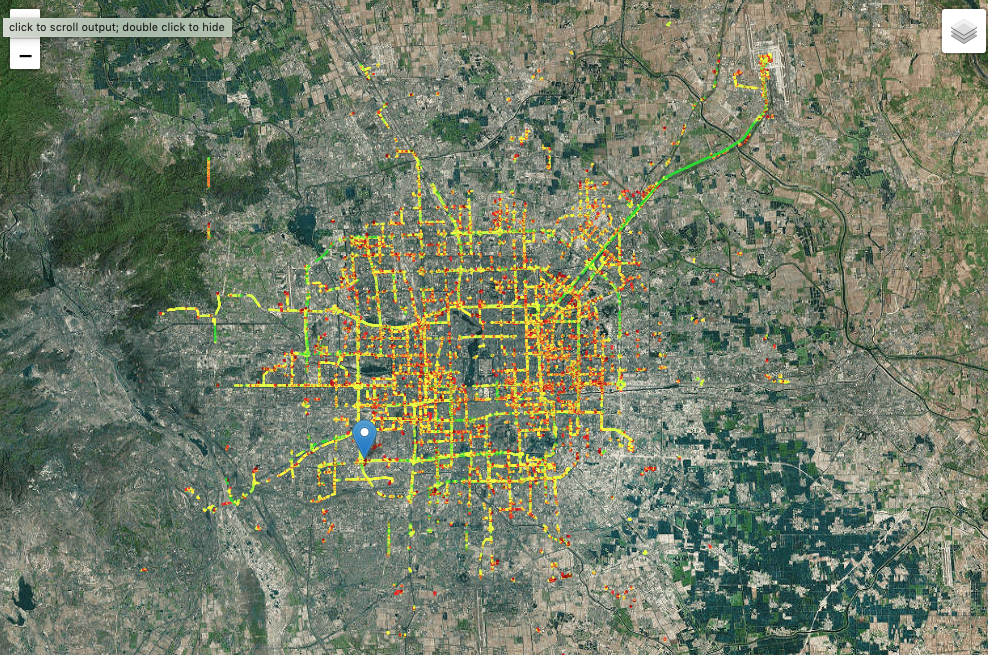

There are also several highway junctions, which could have severe congestions, as the one below.

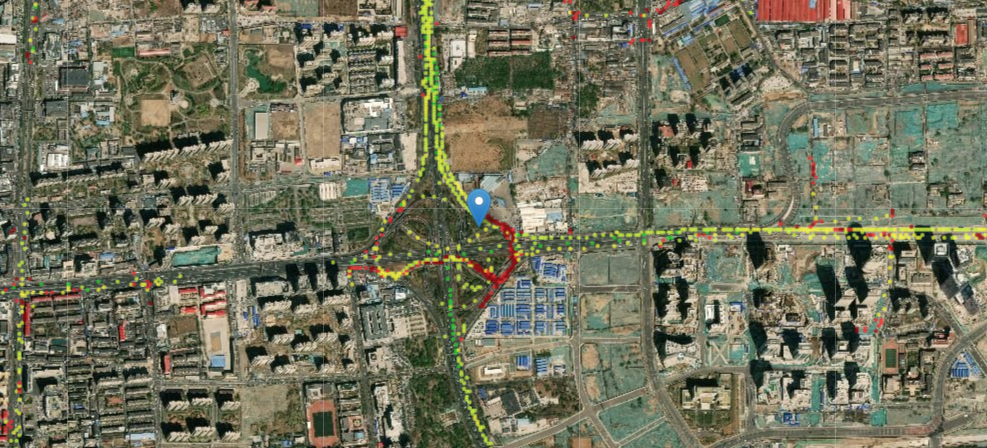

Lastly, it would be interesting to analyze taxi trips separately to find the most probable ones.  
However, there are several difficulties:
- There is no explicit information about start/end of trips
- There are not many cars with frequent GPS signals (<= 5 sec). If signals are rare, we can lose the moment when taxi picks up / drops off passengers
- There are lots of traffic lights, thus it is hard to separate pick-ups / drop-offs from waiting at traffic light.

Resolving all these issues could be hard and time-consuming.  
However, it still makes sense in attempting to plot easier types of tracks. For example, trips from airport to city center to find most popular places people usually go to after landing in Beijing.

In [23]:
# Time of driving
data["drive_td"] = np.where(data["wait_td"] == 0, data["td"], 0)

# Let's stick to cars with 5-min intervals, because there are more of them
data_trip = data[(data.freq / 60).round() == 5]

print(f"Number of data points: {data_trip.shape[0]:,}")
print(f"Number of cars: {data_trip.id.unique().shape[0]:,}")

# Cumulative time of driving at each time step
data_trip["drive_cum"] = data_trip.groupby("id")["drive_td"] \
                                  .transform(cumulative_sum)

# Max of cumulative time of driving for current driving interval
data_trip["drive_max"] = data_trip.groupby("id")["drive_cum"] \
                            .transform(cumulative_max)

# Index of row with max cumulative time of driving 
data_trip["drive_max_ind"] = data_trip.groupby("id")["drive_cum"] \
                .transform(lambda x: cumulative_max(x, ret_idxs=True))

Number of data points: 8,291,116
Number of cars: 6,719


Using very restrictive conditions on trips, one could get start / end indices of drives from airport to city center.

In [24]:
# Area near international airport of Beijing
airport_bounds = {
                    "lat": (40.073494298546706, 40.082573856338314),
                    "long": (116.57771604628293, 116.59058450063704)
                 }

# Approximate area of city center
center_bounds = {
                    "lat":  (39.81800002649285, 39.992506993017535),
                    "long": (116.2157027102414, 116.49886031030802)
                }

def find_trips(df, thrs_wait=(2*60, np.inf), thrs_drive=(15*60, 60*60)):
    """
    Find start/end indices of trips from airport area to the city center.
    
    Following logics is used:
        1) Taxi drivers waits for some time before picking up passenger.
            (explicit waiting is used to avoid cases when taxi drops off 
            passenger instead)
        2) When taxi drops off passenger, travelled distance at this 
            interval should decrease substantially (because velocity 
            decrease substantially). Travelled distance also should be
            low to be able to detect approximate location of drop-off.
            
    Parameters
    ----------
    thrs_wait: tuple
        (min, max) time of waiting before passenger is picked up.
    thrs_drive: tuple
        (min, max) time of driving before passenger is dropped off.
    """
    idxs = []
    # Candidate indices for trip start
    idxs_start = df[\
                    (df["wait_cum"] == df["wait_max"]) & \
                    (df["wait_max"] >= thrs_wait[0]) & \
                    (df["wait_max"] <= thrs_wait[1]) & \
                    (df["lat"] > airport_bounds["lat"][0]) & \
                    (df["lat"] < airport_bounds["lat"][1]) & \
                    (df["long"] > airport_bounds["long"][0]) & \
                    (df["long"] < airport_bounds["long"][1]) \
                   ].index + 1
    
    if len(idxs_start) == 0:
        return idxs
    
    # Last start index is not used if it is last point for taxi data
    if idxs_start[-1] == df.index[-1]:
        idxs_start = idxs_start[:-1]
    # Iterate over each candidate index
    for i,idxA in enumerate(idxs_start):
        # Chunk of data from current to next candidate index for start
        idxB = df.index[-1] if i+1 == len(idxs_start) else idxs_start[i+1]
        df_check = df.loc[idxA:idxB]
        # Indices where slow-down happens (implied)
        idxs_slow = df_check[\
                             (df_check["dist"] < 200) & \
                             (df_check["td"] == df_check["freq"]) \
                            ].index
        if len(idxs_slow) == 0:
            continue
        # First slow-down index and corresponding coordinates
        idxQ = idxs_slow[0]
        coordQ = df_check.loc[idxQ, ["lat", "long"]]
        # Check that slow-down happens in city center
        if not ((coordQ["lat"] > center_bounds["lat"][0]) & \
                (coordQ["lat"] < center_bounds["lat"][1]) & \
                (coordQ["long"] > center_bounds["long"][0]) & \
                (coordQ["long"] < center_bounds["long"][1])):
            continue
        # Reduce data chunk from start to slow-down
        df_check = df_check.loc[idxA:idxQ]
        # Check driving time
        if (df_check["drive_td"].sum() > thrs_drive[0]) and \
           (df_check["drive_td"].sum() < thrs_drive[1]):
            idxs.append((idxA, idxQ))
    return idxs


# Get indices of trips
idxs = []
for i in tqdm.tqdm(data_trip.id.unique()):
    idxs.extend(find_trips(data_trip[data_trip.id == i]))
idxs = np.array(idxs)

100%|██████████| 6719/6719 [01:40<00:00, 66.74it/s]


Plot locations where trips are finished

In [25]:
data_plot = data.loc[idxs[:,1]]
locs = [tuple(x) for x in data_plot[["lat", "long"]].values]
m = create_map(hm_locs=locs, zoom=11, max=.001)

# Plot points of interest as markers on the map
coords = [
            (39.912356160976614, 116.45318101610299),
         ]

m.add_layer(MarkerCluster(
    markers=[Marker(location=c, draggable=False) for c in coords],
    name="PointsOfInterest"
))

m

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

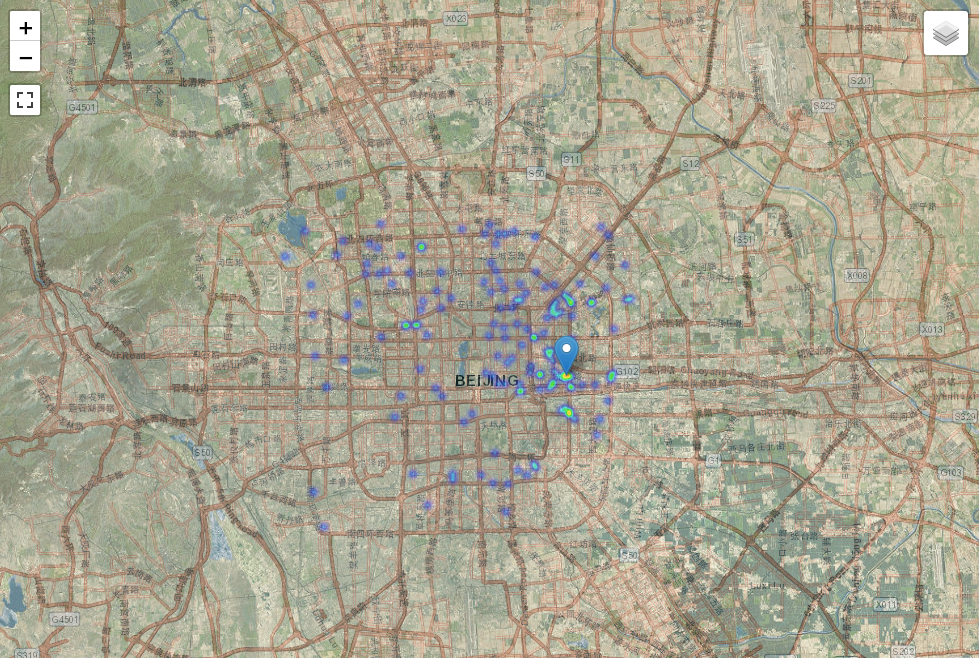

The most popular destinations - busy area where *China World Trade Center* is located with lots of hotels nearby.

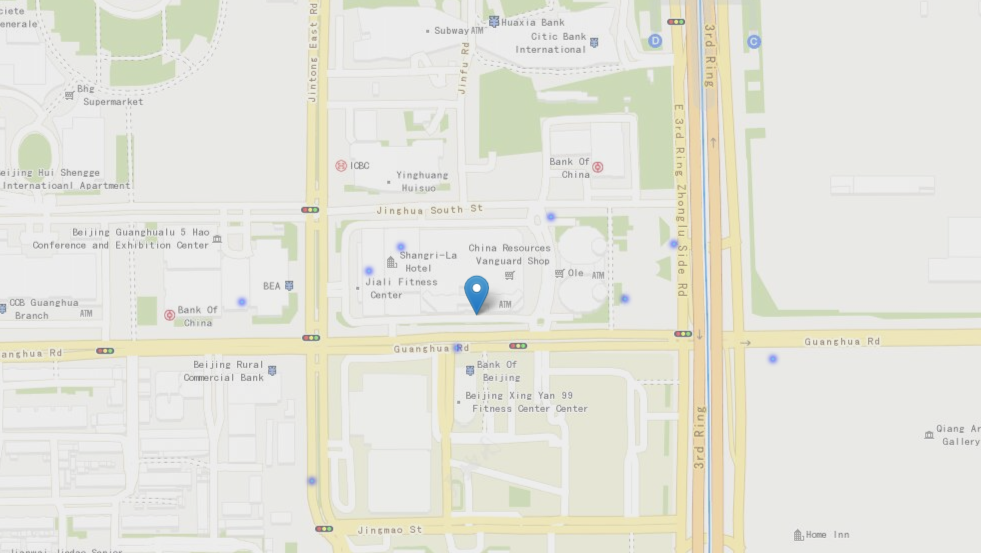

**Challenges faced**:
 - GPS offset problem for Chinese maps, for example Google Maps could not be used directly.
 - Most of providers of Chinese maps annotate them in local language, for example, these ones https://github.com/htoooth/Leaflet.ChineseTmsProviders.
 - There is no simple tool within `Leaflet.js` to visualize traffic as single layer.
 - Absence of explicit information about start/end of trips.
 - Most of cars are equipped with GPS having rare signal frequency (> 1 min).